In [101]:
#Import the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.tokenize import word_tokenize
import nltk
from wordcloud import WordCloud
from nltk.corpus import stopwords


pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.options.display.max_colwidth = 500

import warnings
warnings.filterwarnings('ignore')

In [27]:
#pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [102]:
#Read the files into a dataframe
df=pd.read_csv('ratinglaptop.csv')
df1=pd.read_csv('ratingheadphones.csv')
df2=pd.read_csv('ratingprinter.csv')
df3=pd.read_csv('ratingrouter.csv')
df4=pd.read_csv('ratingsmartwatches.csv')
df5=pd.read_csv('ratingtheatre.csv')
df6=pd.read_csv('ratingmobile.csv')
df7=pd.read_csv('ratingcamera.csv')


In [103]:
data=pd.concat([df,df1,df2,df3,df4,df5,df6,df7],axis=0)

In [104]:
data.head()

,Unnamed: 0,Rating,Review,Review_Summary
0,0,5,Laptop is amazing and sleek. Good for day-to-day use.\nSSD really helps in boosting the performance however do buy a laptop stand as it may heat up otherwise.\nBoots-up in around 30 secs. Windows 11 licensed is pre-installed. Works smoothly for not so heavy users.,Best in the market!
1,1,3,Good performing laptop\nBut less port option\nDoesn't have rj45 and type c port\nAnd display isn't bright enough,Just okay
2,2,5,Nice product,Fabulous!
3,3,5,Awesome.\nI edited my review after 10 days of using.\n\nPerformance\nDisplay\nBattery\nSsd\nHdd\n....... everything is mind blowing...,Great product
4,4,5,Sounds quality and Hardware best quality.,Super!


In [105]:
data.drop(columns='Unnamed: 0',inplace=True)

In [106]:
data['Rating'].value_counts()

5    54365
4    17665
1    12447
3     6412
2     3480
Name: Rating, dtype: int64

Inorder that the dataset is balanced, see that there are equal number of reviews for each of the ratings.

In [107]:
data1=pd.concat([data[data['Rating']==5].sample(n=3480),data[data['Rating']==4].sample(n=3480),data[data['Rating']==3].sample(n=3480),data[data['Rating']==2].sample(n=3480),data[data['Rating']==1].sample(n=3480)],axis=0)

In [108]:
data1['Rating'].value_counts()

5    3480
4    3480
3    3480
2    3480
1    3480
Name: Rating, dtype: int64

In [109]:
data1['Review'].dtype

dtype('O')

In [110]:
#Define a function for cleaning and getting the words in the text
def cleanwordlist(textdata):
    wordlist=[]
    for t in textdata:
        text=str(t)
        text=text.lower()
        tokens=word_tokenize(text)
        words=[word for word in tokens if word.isalpha()]
        wordlist.extend(words)
    return(wordlist)

In [111]:
#Define the stopwords
stopset=set(stopwords.words('english'))
#stopset.update(('laptop','bass','earphone','flipkart','product','headphones','flipkart','printer','router','smartwatch','hometheatre'))

In [112]:
#Define a function for creating a wordcloud
def wordscloud(string):
    word_cloud=WordCloud(width=1600,height=800,background_color='black',stopwords=stopset,max_words=50).generate(' '.join(string))
    plt.figure(figsize=(20,10))
    plt.imshow(word_cloud)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

Create WordClouds corresponding to each of the ratings for both full review and summary review

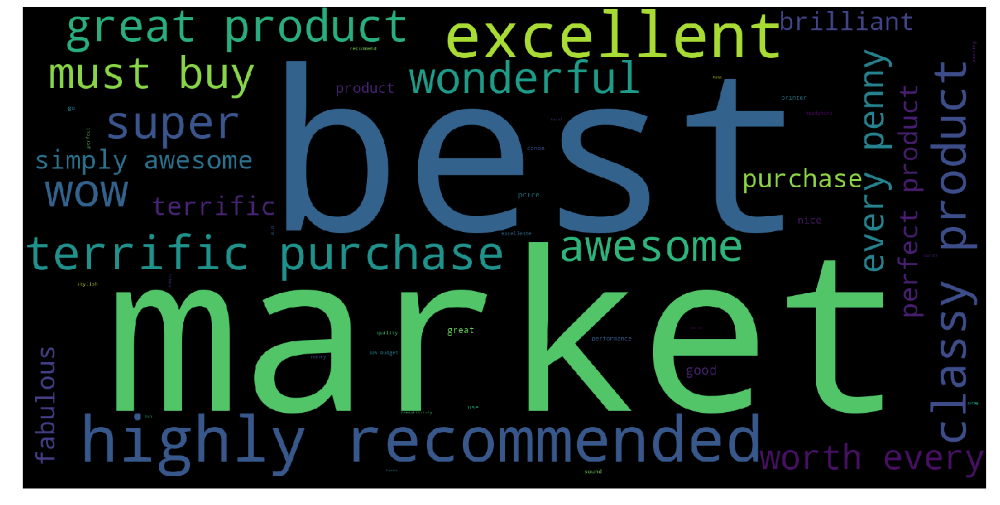

In [113]:
#WordCloud for review summary of rating 5
rating5=cleanwordlist(data1[data1['Rating']==5]['Review_Summary'])
wordscloud(rating5)

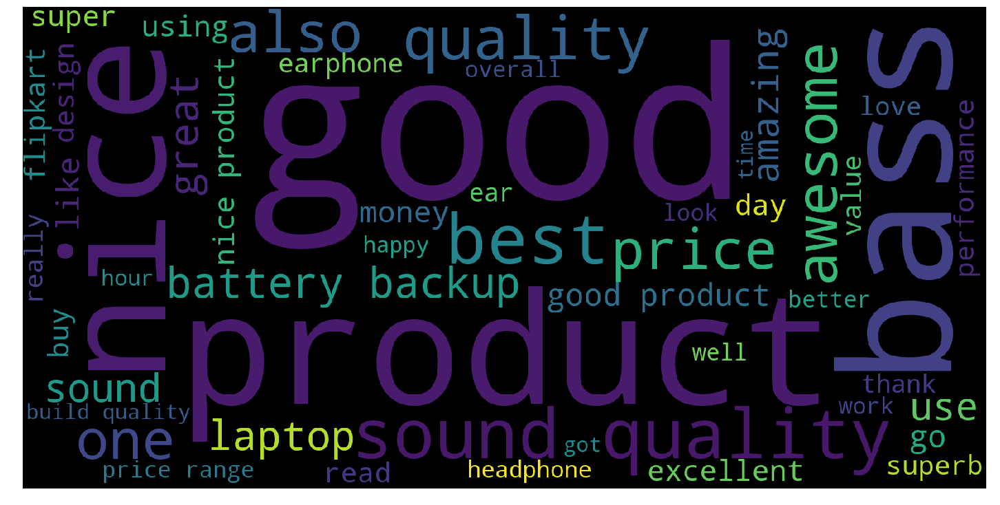

In [114]:
#WordCloud for full review of rating 5
rating5_1=cleanwordlist(data1[data1['Rating']==5]['Review'])
wordscloud(rating5_1)

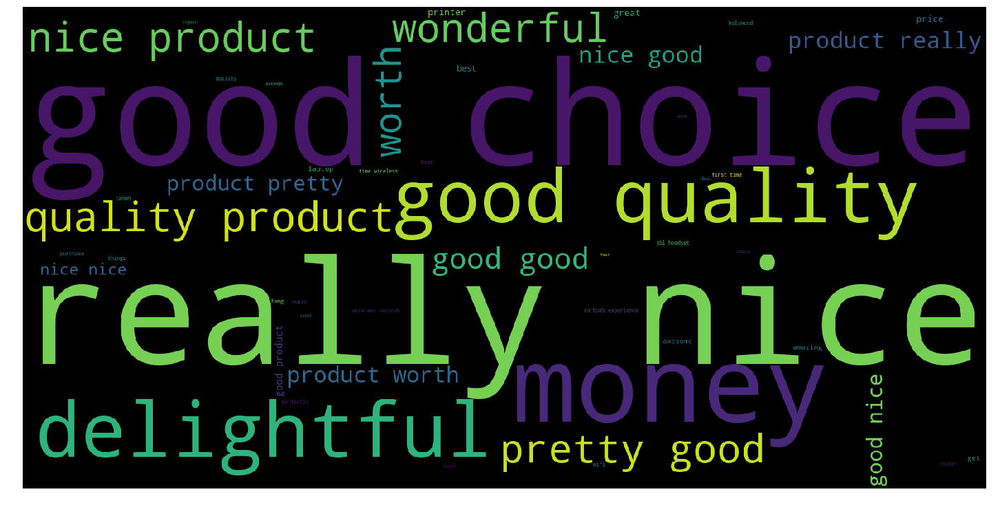

In [115]:
#WordCloud for review summary of rating 4
rating4=cleanwordlist(data1[data1['Rating']==4]['Review_Summary'])
wordscloud(rating4)

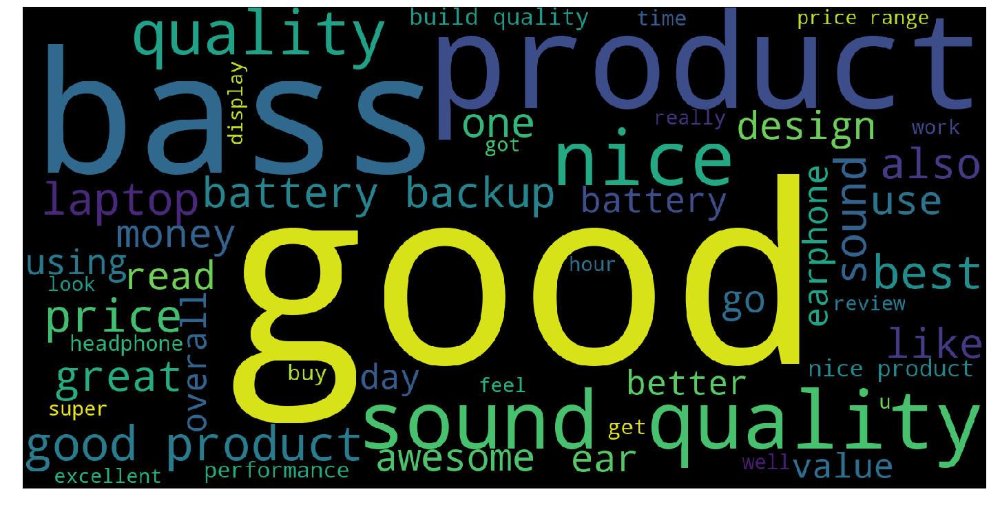

In [116]:
#WordCloud for full review of rating 4
rating4_1=cleanwordlist(data1[data1['Rating']==4]['Review'])
wordscloud(rating4_1)

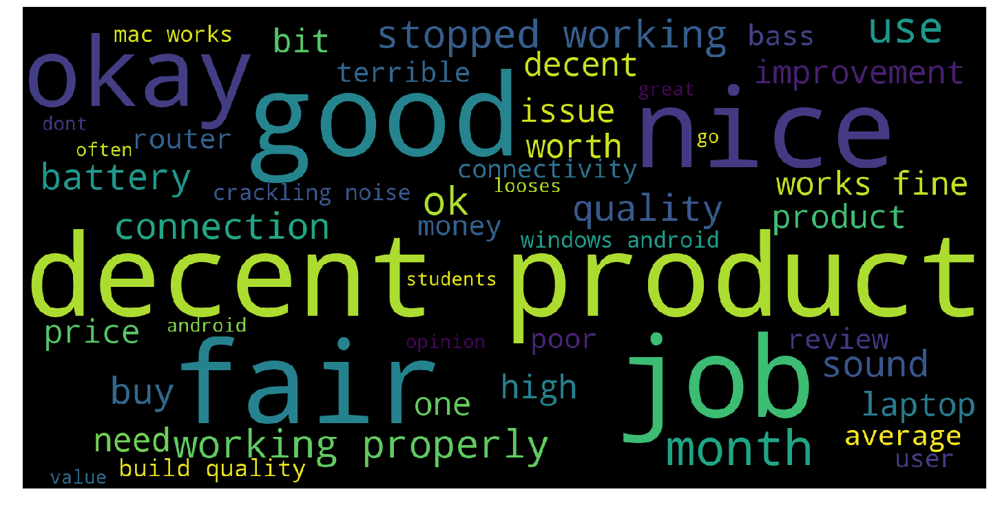

In [117]:
#WordCloud for review summary of rating 3
rating3=cleanwordlist(data1[data1['Rating']==3]['Review_Summary'])
wordscloud(rating3)

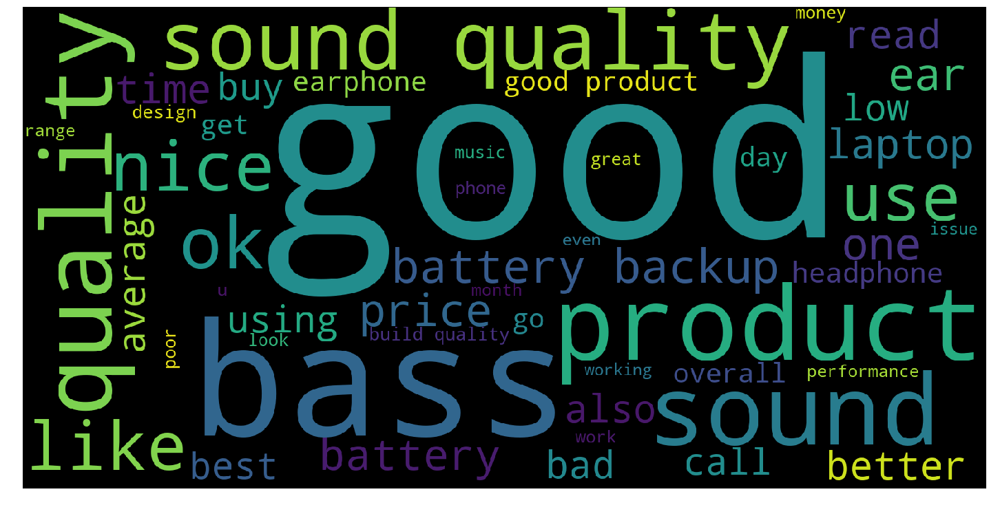

In [118]:
#WordCloud for full review of rating 3
rating3_1=cleanwordlist(data1[data1['Rating']==3]['Review'])
wordscloud(rating3_1)

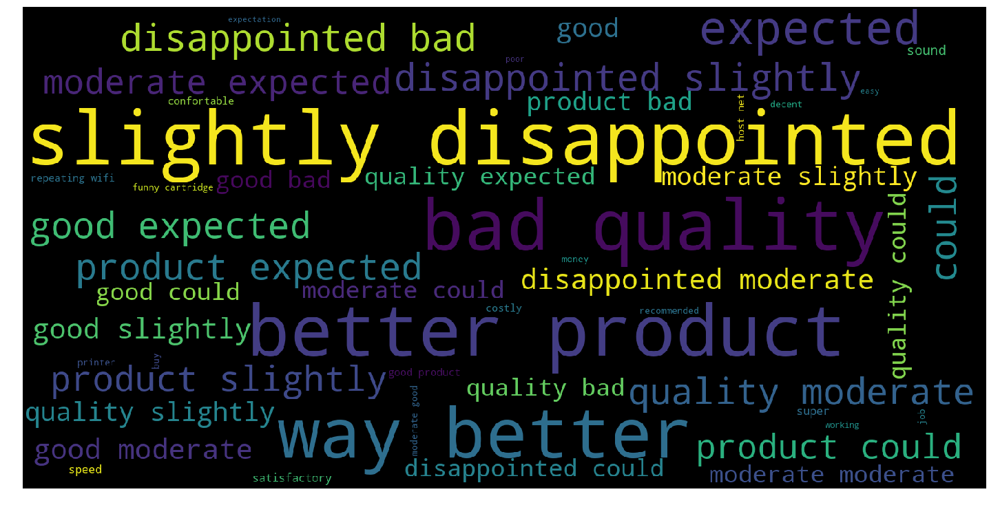

In [119]:
#WordCloud for review summary of rating 2
rating2=cleanwordlist(data1[data1['Rating']==2]['Review_Summary'])
wordscloud(rating2)

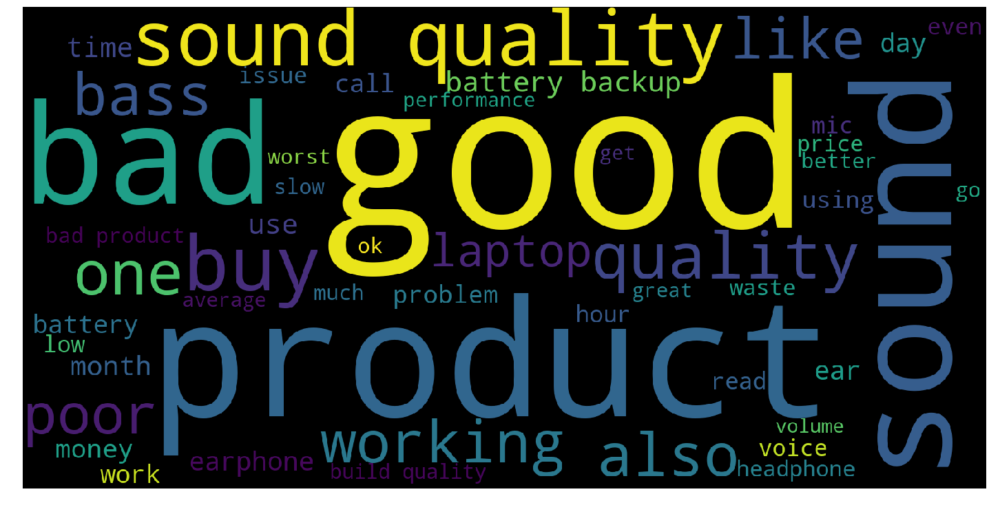

In [120]:
#WordCloud for full review of rating 2
rating2_1=cleanwordlist(data1[data1['Rating']==2]['Review'])
wordscloud(rating2_1)

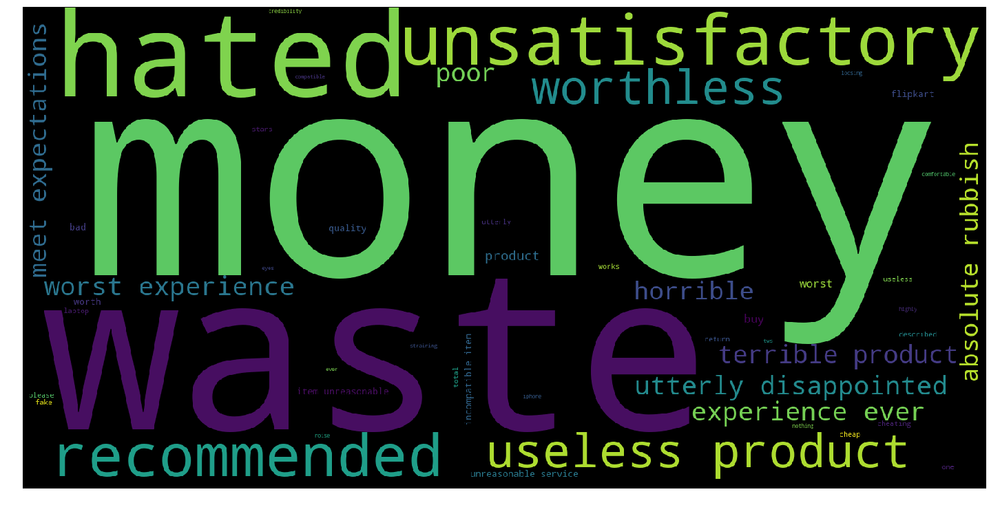

In [121]:
#WordCloud for review summary of rating 1
rating1=cleanwordlist(data1[data1['Rating']==1]['Review_Summary'])
wordscloud(rating1)

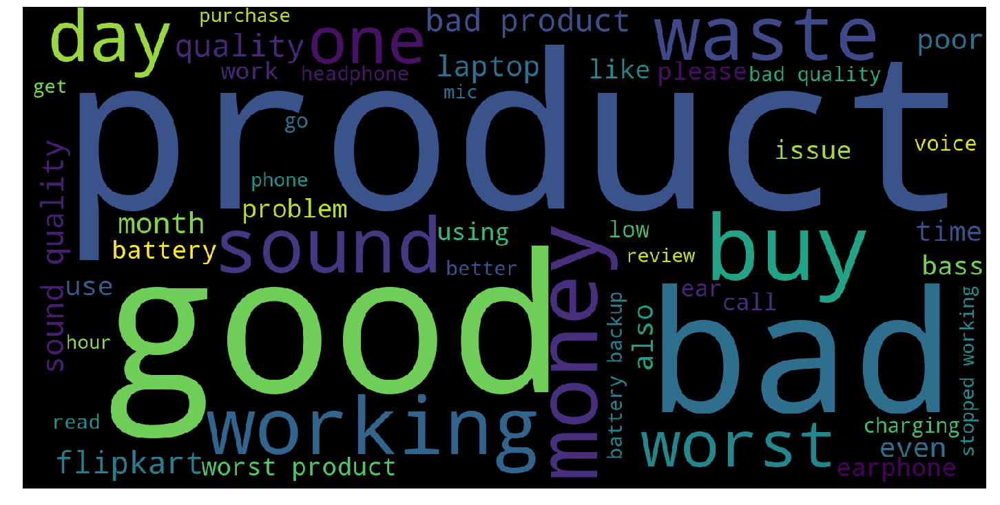

In [122]:
#WordCloud for full review of rating 1
rating1_1=cleanwordlist(data1[data1['Rating']==1]['Review'])
wordscloud(rating1_1)

From the above wordclouds it can be seen that

For ratings 4 and 5, there are more positive words like excellent,fabulous,good,nice,love etc.

For rating 3, there are few negative words like poor,low along with positive words

For rating 2, there are more negative words like waste even though there are few positive words like ok,better.

For rating 1, there are only negative words like worst,bad, absolute rubbish, worthless etc

In [123]:
data1.shape

(17400, 3)

In [124]:
data1.head()

,Rating,Review,Review_Summary
13854,5,very strong very smooth sound quality also nice battery backup also good I m really happy with this Boult Audio,Excellent
786,5,Just amazing !!!\nNice experience with powerful processor... Very good battery backup (about 6 hrs).. in good price..\nJust go for it !!!,Wonderful
6810,5,"Worth of money, good work from Nokia this time.",Mind-blowing purchase
2213,5,I loved it,Simply awesome
990,5,"Best smart watch at this cost of 2500........ thank u boat, and flipkart bcz they sent first wrong pincode and resent on 1day late........ i believed on flipkart bcz of quality based on the time, now a days good response from flipkart ekart also good response",Terrific purchase


In [125]:
data1.reset_index(inplace=True)

Clean the text of Review  and Summary review columns

Convert the text in the columns to lower case

Tokenize the text

Retain only the alphabetical words so that punctuation,numerics, special characters are removed.

Remove the stop words

Apply the WordNetLemmatizer

In [126]:
from nltk.stem import WordNetLemmatizer
lemma= WordNetLemmatizer()
wordslist=[]
for i in range(len(data1['Review'])):
    text=str(data1['Review'][i])
    text=text.lower()
    tokens=word_tokenize(text)
    words=[word for word in tokens if word.isalpha()]
    words=[w for w in words if not w in stopset]
    cleanwords=[lemma.lemmatize(w) for w in words]
    wordslist.extend(cleanwords)
    data1['Review'][i]=' '.join(wordslist)
    wordslist[:]=[]
    cleanwords[:]=[]

In [127]:
wordslist=[]
for i in range(len(data1['Review_Summary'])):
    text=str(data1['Review_Summary'][i])
    text=text.lower()
    tokens=word_tokenize(text)
    words=[word for word in tokens if word.isalpha()]
    words=[w for w in words if not w in stopset]
    cleanwords=[lemma.lemmatize(w) for w in words]
    wordslist.extend(cleanwords)
    data1['Review_Summary'][i]=' '.join(wordslist)
    wordslist[:]=[]
    cleanwords[:]=[]

In [128]:
data1

,index,Rating,Review,Review_Summary
0,13854,5,strong smooth sound quality also nice battery backup also good really happy boult audio,excellent
1,786,5,amazing nice experience powerful processor good battery backup hr good go,wonderful
2,6810,5,worth money good work nokia time,purchase
3,2213,5,loved,simply awesome
4,990,5,best smart watch cost thank u boat flipkart bcz sent first wrong pincode resent late believed flipkart bcz quality based time day good response flipkart ekart also good response,terrific purchase
5,27429,5,best quality nice sound,best market
6,44,5,superb quality sound issue using since,terrific
7,809,5,watch look really cool loved thanks fast delivery excellent choice looking fitness band,highly recommended
8,9281,5,sound quality awesome battery life available separate buy min meant wire one,worth every penny
9,17375,5,awesome hed set really super charging minimum day battery backup superb bass superb haily recommend boat blutooth hed set,excellent


Apply TfidfVectorizer on the feature columns which will convert collection of text documents into numerical feature vectors

In [130]:
from sklearn.feature_extraction.text import CountVectorizer
vect=CountVectorizer(ngram_range=(1,2))
features1=vect.fit_transform(data1['Review'])

X=features1
Y=data1['Rating']

In [131]:
from sklearn.feature_extraction.text import TfidfVectorizer
vect1=TfidfVectorizer(ngram_range=(1,2))
features=vect1.fit_transform(data1['Review'])

x=features
y=data1['Rating']

# Model Fitting

In [84]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve,roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import MultinomialNB

In [132]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=32)

# Decision Tree Classifier

In [133]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred=dtc.predict(x_test)
print('accuracy score',accuracy_score(y_test,pred))
print('confusion matrix \n',confusion_matrix(y_test,pred))
print('\n classification report \n',classification_report(y_test,pred))

accuracy score 0.5124521072796935
confusion matrix 
 [[697 178 104  36  33]
 [283 559 122  47  43]
 [137 103 565 160 103]
 [ 74  55 214 405 291]
 [ 44  50 169 299 449]]

 classification report 
               precision    recall  f1-score   support

           1       0.56      0.67      0.61      1048
           2       0.59      0.53      0.56      1054
           3       0.48      0.53      0.50      1068
           4       0.43      0.39      0.41      1039
           5       0.49      0.44      0.47      1011

    accuracy                           0.51      5220
   macro avg       0.51      0.51      0.51      5220
weighted avg       0.51      0.51      0.51      5220



In [134]:
score=cross_val_score(dtc,x,y,cv=8)
print(score.mean(),'difference b/w accuracy score and cv score is ',round(accuracy_score(y_test,pred)-score.mean(),3))


0.5357471264367816 difference b/w accuracy score and cv score is  -0.023


# KNN

In [147]:
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train,y_train)
knn.score(x_train,y_train)
pred=knn.predict(x_test)
print('accuracy score',accuracy_score(y_test,pred))
print('confusion matrix \n',confusion_matrix(y_test,pred))
print('\n classification report \n',classification_report(y_test,pred))

accuracy score 0.3521072796934866
confusion matrix 
 [[480 259 151 105  53]
 [306 504 121  79  44]
 [248 174 422 125  99]
 [234 181 261 234 129]
 [253 159 216 185 198]]

 classification report 
               precision    recall  f1-score   support

           1       0.32      0.46      0.37      1048
           2       0.39      0.48      0.43      1054
           3       0.36      0.40      0.38      1068
           4       0.32      0.23      0.26      1039
           5       0.38      0.20      0.26      1011

    accuracy                           0.35      5220
   macro avg       0.35      0.35      0.34      5220
weighted avg       0.35      0.35      0.34      5220



In [148]:
score=cross_val_score(knn,x,y,cv=8)
print(score.mean(),'difference b/w accuracy score and cv score is ',round(accuracy_score(y_test,pred)-score.mean(),3))


0.36063218390804597 difference b/w accuracy score and cv score is  -0.009


# Naive Bayes

In [150]:
mnb=MultinomialNB()
mnb.fit(x_train,y_train)
pred=mnb.predict(x_test)
print('accuracy score:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score: 0.5511494252873563
[[685 199  73  64  27]
 [250 553  94 108  49]
 [ 53 122 483 252 158]
 [ 12  26 118 513 370]
 [  5  16  48 299 643]]
              precision    recall  f1-score   support

           1       0.68      0.65      0.67      1048
           2       0.60      0.52      0.56      1054
           3       0.59      0.45      0.51      1068
           4       0.42      0.49      0.45      1039
           5       0.52      0.64      0.57      1011

    accuracy                           0.55      5220
   macro avg       0.56      0.55      0.55      5220
weighted avg       0.56      0.55      0.55      5220



In [151]:
score=cross_val_score(mnb,x,y,cv=8)
print(score.mean(),'difference b/w accuracy score and cv score is ',round(accuracy_score(y_test,pred)-score.mean(),3))


0.5594827586206896 difference b/w accuracy score and cv score is  -0.008


# Support Vector Machine Classifier(SVM)

In [156]:
svc=SVC(kernel='poly')
svc.fit(x_train,y_train)
svc.score(x_train,y_train)
pred=svc.predict(x_test)
print('accuracy score',accuracy_score(y_test,pred))
print('confusion matrix \n',confusion_matrix(y_test,pred))
print('\n classification report \n',classification_report(y_test,pred))

accuracy score 0.5136015325670498
confusion matrix 
 [[649  66  40  20 273]
 [244 488  55  36 231]
 [ 72  36 453  92 415]
 [ 20   8 124 307 580]
 [  8   7  87 125 784]]

 classification report 
               precision    recall  f1-score   support

           1       0.65      0.62      0.64      1048
           2       0.81      0.46      0.59      1054
           3       0.60      0.42      0.50      1068
           4       0.53      0.30      0.38      1039
           5       0.34      0.78      0.48      1011

    accuracy                           0.51      5220
   macro avg       0.59      0.52      0.52      5220
weighted avg       0.59      0.51      0.52      5220



In [157]:
score=cross_val_score(svc,x,y,cv=8)
print(score.mean(),'difference b/w accuracy score and cv score is ',round(accuracy_score(y_test,pred)-score.mean(),3))


0.5283908045977012 difference b/w accuracy score and cv score is  -0.015


# Random Forest Classifier

In [154]:
rf=RandomForestClassifier(n_estimators=100)
rf.fit(x_train,y_train)
pred=rf.predict(x_test)
print('accuracy score',accuracy_score(y_test,pred))
print('confusion matrix \n',confusion_matrix(y_test,pred))
print('\n classification report \n',classification_report(y_test,pred))

accuracy score 0.5678160919540229
confusion matrix 
 [[770 148  78  27  25]
 [302 576 115  35  26]
 [109  99 571 170 119]
 [ 37  31 190 479 302]
 [ 23  22 128 270 568]]

 classification report 
               precision    recall  f1-score   support

           1       0.62      0.73      0.67      1048
           2       0.66      0.55      0.60      1054
           3       0.53      0.53      0.53      1068
           4       0.49      0.46      0.47      1039
           5       0.55      0.56      0.55      1011

    accuracy                           0.57      5220
   macro avg       0.57      0.57      0.57      5220
weighted avg       0.57      0.57      0.57      5220



In [155]:
score=cross_val_score(rf,x,y,cv=8)
print(score.mean(),'difference b/w accuracy score and cv score is ',round(accuracy_score(y_test,pred)-score.mean(),3))


0.5800574712643678 difference b/w accuracy score and cv score is  -0.012


# AdaBoost Classifier

In [158]:
from sklearn.ensemble import AdaBoostClassifier
ad=AdaBoostClassifier()
ad.fit(x_train,y_train)
pred=ad.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))    

0.43007662835249044
[[607 319  86  17  19]
 [341 440 187  52  34]
 [ 95 267 414 190 102]
 [ 35 134 285 296 289]
 [ 23  92 180 228 488]]
              precision    recall  f1-score   support

           1       0.55      0.58      0.56      1048
           2       0.35      0.42      0.38      1054
           3       0.36      0.39      0.37      1068
           4       0.38      0.28      0.32      1039
           5       0.52      0.48      0.50      1011

    accuracy                           0.43      5220
   macro avg       0.43      0.43      0.43      5220
weighted avg       0.43      0.43      0.43      5220



In [159]:
score=cross_val_score(ad,x,y,cv=8)
print(score.mean(),'difference b/w accuracy score and cv score is ',round(accuracy_score(y_test,pred)-score.mean(),3))


0.4296551724137931 difference b/w accuracy score and cv score is  0.0


# From the above it can be seen that Naive Bayes performs better.Choose Naive Bayes as the model.

It can be seen that the accuracy of all the models is very low.

Lets consider 'Review_Summary' feature and check how the models fit

In [162]:
indvar=vect1.fit_transform(data1['Review_Summary'])

x=indvar
y=data1['Rating']

In [163]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=32)

In [164]:
mnb=MultinomialNB()
mnb.fit(x_train,y_train)
pred=mnb.predict(x_test)
print('accuracy score:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

accuracy score: 0.8936781609195402
[[1037    1    6    3    1]
 [   2  870    6  175    1]
 [   3    1  891  171    2]
 [   1    0    9  928  101]
 [   0    1    5   66  939]]
              precision    recall  f1-score   support

           1       0.99      0.99      0.99      1048
           2       1.00      0.83      0.90      1054
           3       0.97      0.83      0.90      1068
           4       0.69      0.89      0.78      1039
           5       0.90      0.93      0.91      1011

    accuracy                           0.89      5220
   macro avg       0.91      0.89      0.90      5220
weighted avg       0.91      0.89      0.90      5220



In [165]:
score=cross_val_score(mnb,x,y,cv=8)
print(score.mean(),'difference b/w accuracy score and cv score is ',round(accuracy_score(y_test,pred)-score.mean(),3))


0.8956321839080459 difference b/w accuracy score and cv score is  -0.002


It can be seen that considering review summaries, accuracy improved a lot. Further study is needed to improve the accuracy for full reviews.